In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os
from tqdm import tqdm
from google.colab import drive
import multiprocessing
import time
import gc
import cv2
from torch.nn import functional as F

In [ ]:
# 挂载 Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
# **3. 释放 GPU 内存，防止卡住**
torch.cuda.empty_cache()
gc.collect()

# 重置GPU内存统计
torch.cuda.reset_peak_memory_stats()

# 检查可用显存
total = torch.cuda.get_device_properties(0).total_memory / 1024**3
free = torch.cuda.memory_reserved() / 1024**3
print(f"可用显存: {free:.2f}GB / 总量: {total:.2f}GB")

可用显存: 0.00GB / 总量: 39.56GB


size of train set: 10710
size of test set: 1890
class: ['calling', 'clapping', 'cycling', 'dancing', 'drinking', 'eating', 'fighting', 'hugging', 'laughing', 'listening_to_music', 'running', 'sitting', 'sleeping', 'texting', 'using_laptop']

train set
----------------------------------------
calling: 714
clapping: 714
cycling: 714
dancing: 714
drinking: 714
eating: 714
fighting: 714
hugging: 714
laughing: 714
listening_to_music: 714
running: 714
sitting: 714
sleeping: 714
texting: 714
using_laptop: 714
----------------------------------------


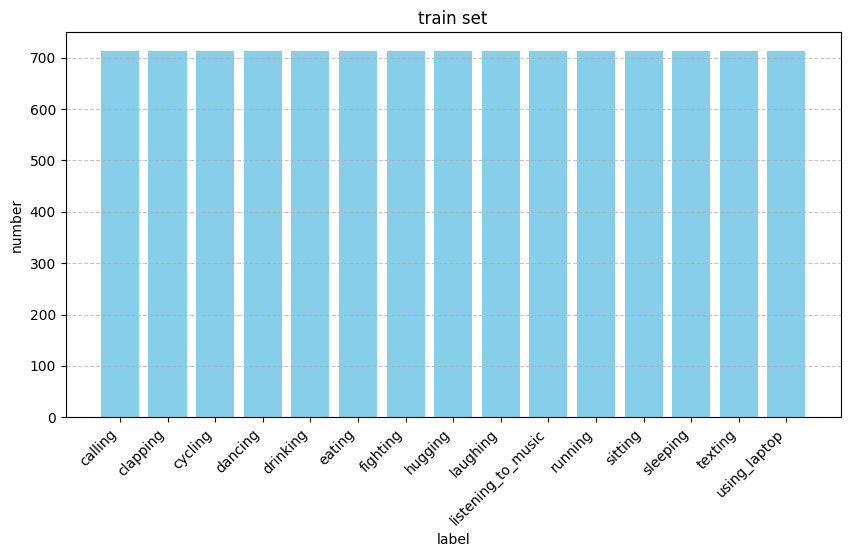


test set
----------------------------------------
calling: 126
clapping: 126
cycling: 126
dancing: 126
drinking: 126
eating: 126
fighting: 126
hugging: 126
laughing: 126
listening_to_music: 126
running: 126
sitting: 126
sleeping: 126
texting: 126
using_laptop: 126
----------------------------------------


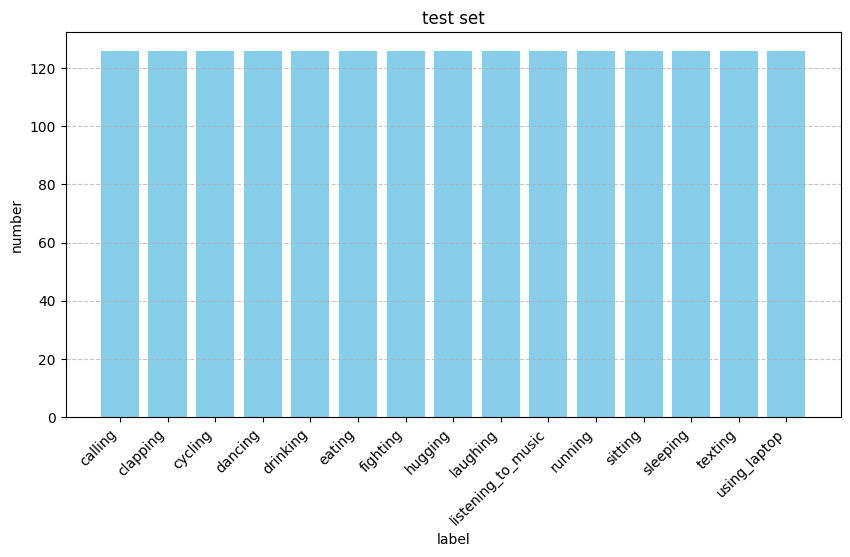

num_workers: 4
batch_size: 64


In [ ]:
# **4. 训练和测试数据路径**
train_dir = "/content/drive/MyDrive/project_2025/archive/Structured/train"
test_dir = "/content/drive/MyDrive/project_2025/archive/Structured/test"

# **5. 数据增强**
transform = transforms.Compose([
    # transforms.Resize((128, 128)),  # 统一大小
    transforms.Resize((256, 256)),  # 统一大小
    transforms.RandomHorizontalFlip(p=0.5),  # 50% 概率水平翻转
    transforms.RandomRotation(10),  # 旋转范围减少
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# **6. 加载数据**
train_dataset = ImageFolder(root=train_dir, transform=transform)
test_dataset = ImageFolder(root=test_dir, transform=transform)

# **7. 确保数据集正确加载**
print(f"size of train set: {len(train_dataset)}")
print(f"size of test set: {len(test_dataset)}")
print(f"class: {test_dataset.classes}")
assert len(test_dataset) > 0, "错误: `test_dataset` 为空，请检查数据路径！"

# 统计数据集中每个类别的样本数量
from collections import Counter
def count_class_samples(dataset, dataset_name):
    """ 统计数据集中每个类别的样本数量 """
    class_counts = Counter(dataset.targets)  # 统计每个类别的样本数
    class_names = dataset.classes  # 获取类别名称

    print(f"\n{dataset_name}")
    print("-" * 40)
    for i, class_name in enumerate(class_names):
        print(f"{class_name}: {class_counts[i]}")
    print("-" * 40)

    # **绘制类别分布柱状图**
    plt.figure(figsize=(10, 5))
    plt.bar(class_names, [class_counts[i] for i in range(len(class_names))], color='skyblue')
    plt.xlabel("label")
    plt.ylabel("number")
    plt.title(f"{dataset_name}")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# **调用统计函数**
count_class_samples(train_dataset, "train set")
count_class_samples(test_dataset, "test set")

# **8. 优化 DataLoader，提高 GPU 读取速度**
num_workers = min(4, multiprocessing.cpu_count())  # CPU 核心数
print(f"num_workers: {num_workers}")
batch_size = 64  # 增加 batch_size，提高 GPU 计算效率
print(f"batch_size: {batch_size}")
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

In [ ]:
# **7. 定义 CNN 模型**
class CNN(nn.Module):
  def __init__(self, num_classes):
      super(CNN, self).__init__()

      # 增强的特征提取层（混合卷积核尺寸）
      self.features = nn.Sequential(
          # 第一层使用5x5卷积捕获更大感受野
          nn.Conv2d(3, 64, kernel_size=5, stride=1, padding=2),
          nn.BatchNorm2d(64),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),

          # 第二层使用3x3卷积
          nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(128),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),

          # 第三层使用3x3卷积（深度特征）
          nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(256),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),

          # 第四层使用3x3卷积
          nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(512),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2),

          # 第五层使用1x1卷积压缩通道
          nn.Conv2d(512, 512, kernel_size=1, stride=1),
          nn.BatchNorm2d(512),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2, stride=2)
      )

      # 分类头（全局平均池化+轻量级FC）
      self.classifier = nn.Sequential(
          nn.AdaptiveAvgPool2d((1, 1)),
          nn.Flatten(),
          nn.Linear(512, 256),
          nn.BatchNorm1d(256),
          nn.ReLU(),
          nn.Dropout(0.5),  # 高dropout防止过拟合
          nn.Linear(256, num_classes)
      )

  def forward(self, x):
      x = self.features(x)
      x = self.classifier(x)
      return x

In [ ]:
# **8. 创建模型**
num_classes = len(train_dataset.classes)
model = CNN(num_classes).to(device)  # 强制将模型送入 GPU
print(f"模型设备: {next(model.parameters()).device}")  # 确保模型在 GPU

模型设备: cuda:0


In [ ]:
# **9. 损失函数 & 优化器**
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001) #默认0.0001

In [ ]:
# **10. 训练参数**
num_epochs = 40
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
best_model_path_local = "./best_model.pth"  # 先存本地
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model.pth"  # 训练结束后再存
best_val_acc = 0.0  # 记录最高验证准确率
best_epoch = 0  # 记录最佳 epoch

In [ ]:
# **11. 训练循环**
if os.path.exists(best_model_path_local):
    model.load_state_dict(torch.load(best_model_path_local))
    print(f" 已加载之前的最优模型：{best_model_path_local}")

for epoch in range(num_epochs):
    start_time = time.time()

    # === 训练阶段 ===
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} (Training)", leave=False)

    for images, labels in train_loader_tqdm:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # === 验证阶段 ===
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss = running_loss / len(test_loader)
    val_acc = correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    #  修复打印部分：使用不同变量
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")
    print(f"⏳ 训练时间: {time.time() - start_time:.2f} 秒")

    #  修复保存条件：按 val_acc 判定是否为最佳模型
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_epoch = epoch + 1
        torch.save(model.state_dict(), best_model_path_local)
        print(f"📌 Find better model (Val Acc: {best_val_acc:.4f})，save to `{best_model_path_local}`")


# **12. 训练完成后，拷贝模型到 Google Drive**
import shutil
shutil.copy(best_model_path_local, best_model_path_gdrive)
print(f"best model already copy to Google Drive: {best_model_path_gdrive}")

# **13. 确保模型在 GPU**
print(f"final model at device: {next(model.parameters()).device}")

✅ 已加载之前的最优模型：./best_model.pth


Epoch [1/40] - Train Acc: 0.7321, Val Acc: 0.6053
⏳ 训练时间: 25.16 秒
📌 Find better model (Val Acc: 0.6053)，save to `./best_model.pth`


Epoch [2/40] - Train Acc: 0.7569, Val Acc: 0.5921
⏳ 训练时间: 24.90 秒


Epoch [3/40] - Train Acc: 0.7626, Val Acc: 0.6074
⏳ 训练时间: 24.41 秒
📌 Find better model (Val Acc: 0.6074)，save to `./best_model.pth`


Epoch [4/40] - Train Acc: 0.7697, Val Acc: 0.6095
⏳ 训练时间: 24.47 秒
📌 Find better model (Val Acc: 0.6095)，save to `./best_model.pth`


Epoch [5/40] - Train Acc: 0.7742, Val Acc: 0.6011
⏳ 训练时间: 24.46 秒


Epoch [6/40] - Train Acc: 0.7828, Val Acc: 0.5958
⏳ 训练时间: 24.68 秒


Epoch [7/40] - Train Acc: 0.7872, Val Acc: 0.5937
⏳ 训练时间: 24.52 秒


Epoch [8/40] - Train Acc: 0.7924, Val Acc: 0.5968
⏳ 训练时间: 24.53 秒


Epoch [9/40] - Train Acc: 0.7971, Val Acc: 0.5963
⏳ 训练时间: 24.60 秒


Epoch [10/40] - Train Acc: 0.7962, Val Acc: 0.6037
⏳ 训练时间: 24.79 秒


Epoch [11/40] - Train Acc: 0.8021, Val Acc: 0.6042
⏳ 训练时间: 24.32 秒


Epoch [12/40] - Train Acc: 0.8039, Val Acc: 0.6111
⏳ 训练时间: 24.69 秒
📌 Find better model (Val Acc: 0.6111)，save to `./best_model.pth`


Epoch [13/40] - Train Acc: 0.8048, Val Acc: 0.5947
⏳ 训练时间: 24.49 秒


Epoch [14/40] - Train Acc: 0.8088, Val Acc: 0.5952
⏳ 训练时间: 24.70 秒


Epoch [15/40] - Train Acc: 0.8120, Val Acc: 0.5947
⏳ 训练时间: 25.22 秒


Epoch [16/40] - Train Acc: 0.8165, Val Acc: 0.6005
⏳ 训练时间: 24.41 秒


Epoch [17/40] - Train Acc: 0.8176, Val Acc: 0.5915
⏳ 训练时间: 24.60 秒


Epoch [18/40] - Train Acc: 0.8227, Val Acc: 0.6026
⏳ 训练时间: 24.51 秒


Epoch [19/40] - Train Acc: 0.8198, Val Acc: 0.6063
⏳ 训练时间: 24.63 秒


Epoch [20/40] - Train Acc: 0.8259, Val Acc: 0.6079
⏳ 训练时间: 24.57 秒


Epoch [21/40] - Train Acc: 0.8352, Val Acc: 0.6116
⏳ 训练时间: 24.64 秒
📌 Find better model (Val Acc: 0.6116)，save to `./best_model.pth`


Epoch [22/40] - Train Acc: 0.8363, Val Acc: 0.6159
⏳ 训练时间: 24.51 秒
📌 Find better model (Val Acc: 0.6159)，save to `./best_model.pth`


Epoch [23/40] - Train Acc: 0.8367, Val Acc: 0.6000
⏳ 训练时间: 25.23 秒


Epoch [24/40] - Train Acc: 0.8404, Val Acc: 0.6026
⏳ 训练时间: 24.60 秒


Epoch [25/40] - Train Acc: 0.8435, Val Acc: 0.6005
⏳ 训练时间: 24.67 秒


Epoch [26/40] - Train Acc: 0.8448, Val Acc: 0.5931
⏳ 训练时间: 24.83 秒


Epoch [27/40] - Train Acc: 0.8463, Val Acc: 0.6032
⏳ 训练时间: 24.53 秒


Epoch [28/40] - Train Acc: 0.8474, Val Acc: 0.6085
⏳ 训练时间: 25.26 秒


Epoch [29/40] - Train Acc: 0.8502, Val Acc: 0.6079
⏳ 训练时间: 24.73 秒


Epoch [30/40] - Train Acc: 0.8535, Val Acc: 0.5958
⏳ 训练时间: 24.82 秒


Epoch [31/40] - Train Acc: 0.8553, Val Acc: 0.5958
⏳ 训练时间: 24.38 秒


Epoch [32/40] - Train Acc: 0.8565, Val Acc: 0.6048
⏳ 训练时间: 24.77 秒


Epoch [33/40] - Train Acc: 0.8642, Val Acc: 0.6016
⏳ 训练时间: 24.57 秒


Epoch [34/40] - Train Acc: 0.8637, Val Acc: 0.6026
⏳ 训练时间: 24.77 秒


Epoch [35/40] - Train Acc: 0.8633, Val Acc: 0.5931
⏳ 训练时间: 24.71 秒


Epoch [36/40] - Train Acc: 0.8698, Val Acc: 0.6021
⏳ 训练时间: 24.41 秒


Epoch [37/40] - Train Acc: 0.8705, Val Acc: 0.6048
⏳ 训练时间: 24.35 秒


Epoch [38/40] - Train Acc: 0.8714, Val Acc: 0.5979
⏳ 训练时间: 24.40 秒


Epoch [39/40] - Train Acc: 0.8754, Val Acc: 0.6037
⏳ 训练时间: 24.62 秒


Epoch [40/40] - Train Acc: 0.8798, Val Acc: 0.5984
⏳ 训练时间: 25.03 秒
best model already copy to Google Drive: /content/drive/MyDrive/project_2025/best_model.pth
final model at device: cuda:0


Loading best model from: /content/drive/MyDrive/project_2025/best_model.pth
Best model loaded successfully!

Final test accuracy: 0.6138

Classification Metrics:
Accuracy : 0.6138
Precision: 0.6142
Recall   : 0.6138
F1 Score : 0.6112

Per-class Report:
                    precision    recall  f1-score   support

           calling       0.43      0.44      0.43       126
          clapping       0.70      0.48      0.57       126
           cycling       0.90      0.87      0.89       126
           dancing       0.65      0.67      0.66       126
          drinking       0.54      0.52      0.53       126
            eating       0.79      0.83      0.81       126
          fighting       0.64      0.75      0.69       126
           hugging       0.55      0.49      0.52       126
          laughing       0.62      0.71      0.66       126
listening_to_music       0.58      0.50      0.54       126
           running       0.71      0.74      0.72       126
           sitting       0

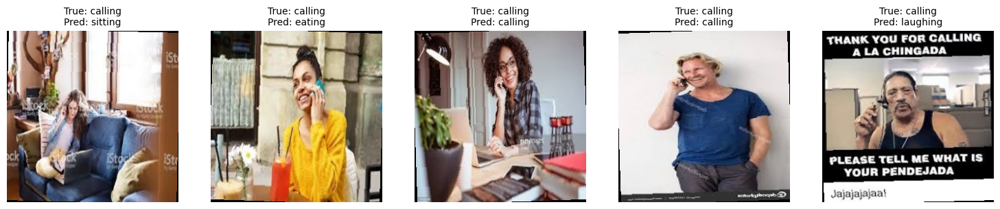

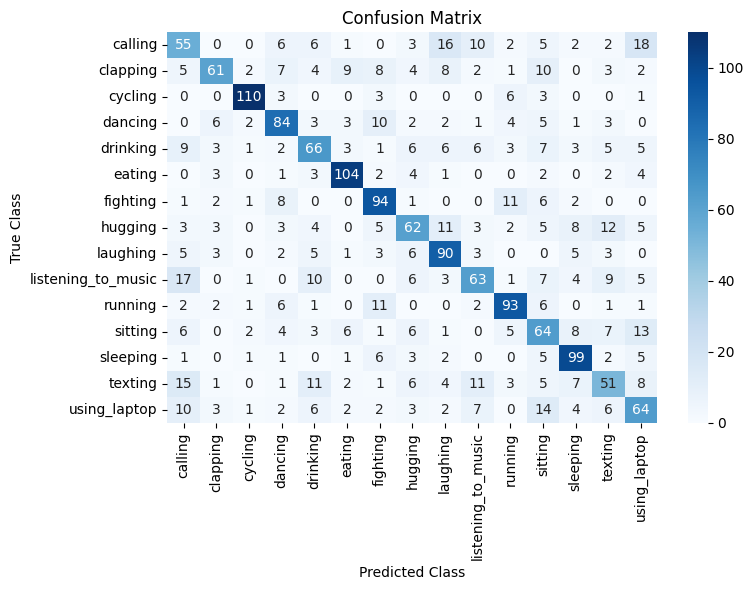

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from torchvision import transforms

# === 加载模型 ===
best_model_path_local = "./best_model.pth"
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model.pth"

model_path = best_model_path_local if os.path.exists(best_model_path_local) else best_model_path_gdrive
print(f"Loading best model from: {model_path}")

model = CNN(num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
model.eval()
print("Best model loaded successfully!")

# === 计算预测 ===
correct, total = 0, 0
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

final_test_acc = correct / total
print(f"\nFinal test accuracy: {final_test_acc:.4f}")

# === 计算并打印分类指标 ===
acc = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')
recall = recall_score(all_labels, all_preds, average='macro')
f1 = f1_score(all_labels, all_preds, average='macro')

print("\nClassification Metrics:")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

# === 每类指标报告 ===
print("\nPer-class Report:")
print(classification_report(all_labels, all_preds, target_names=test_dataset.classes))

# === 可视化部分预测结果 ===
def show_predictions(test_loader, model, class_names, num_images=5):
    model.eval()
    images_shown = 0
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 3, 3))

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            for i in range(images.size(0)):
                if images_shown >= num_images:
                    break

                img = images[i].cpu().permute(1, 2, 0).numpy()
                img = img * 0.5 + 0.5  # 反归一化

                true_label = class_names[labels[i].item()]
                pred_label = class_names[predicted[i].item()]

                ax = axes[images_shown]
                ax.imshow(img)
                ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=10)
                ax.axis("off")

                images_shown += 1

            if images_shown >= num_images:
                break

    plt.tight_layout()
    plt.show()

# === 混淆矩阵绘制函数 ===
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

# === 可视化预测样本 + 混淆矩阵 ===
show_predictions(test_loader, model, test_dataset.classes, num_images=5)
plot_confusion_matrix(all_labels, all_preds, test_dataset.classes)



In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.feature_map = None

        # **注册 Hook，存储梯度**
        def hook_function(module, grad_input, grad_output):
            self.gradients = grad_output[0]  # 只取第一个输出的梯度

        self.target_layer.register_full_backward_hook(hook_function)

        # **注册 Hook，存储 feature map**
        def forward_hook(module, input, output):
            self.feature_map = output  # 存储 `feature map`

        self.target_layer.register_forward_hook(forward_hook)

    def generate_cam(self, image, class_idx):
        """ 计算 Grad-CAM """
        output = self.model(image)
        self.model.zero_grad()

        one_hot_output = torch.zeros_like(output)
        one_hot_output[0, class_idx] = 1
        output.backward(gradient=one_hot_output)

        # **确保获取的是 `feature map`**
        activations = self.feature_map.detach()

        # **计算梯度的全局平均池化**
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

        # **加权每个通道**
        for i in range(activations.shape[1]):
            activations[:, i, :, :] *= pooled_gradients[i]

        heatmap = torch.mean(activations, dim=1).squeeze().cpu().numpy()
        heatmap = np.maximum(heatmap, 0)  # 负值归零
        heatmap /= np.max(heatmap)  # 归一化
        return heatmap


In [ ]:
import matplotlib.pyplot as plt
import cv2
import torchvision.transforms.functional as F

def apply_grad_cam(data_loader, model, grad_cam, class_names, num_images=10):
    model.eval()
    count = 0

    for images, labels in data_loader:
        if count >= num_images:
            break

        image = images.to(device)
        label = labels.item()

        # **前向 + 反向传播**
        output = model(image)
        pred_class = output.argmax(dim=1).item()

        # **生成热图（以预测类为目标）**
        heatmap = grad_cam.generate_cam(image, class_idx=pred_class)

        # **图像和热图的叠加处理**
        img_np = image[0].cpu().permute(1, 2, 0).numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())  # 归一化到0~1
        img_np = np.uint8(255 * img_np)

        heatmap_resized = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img_np, 0.6, heatmap_color, 0.4, 0)

        # **显示结果**
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 3, 1)
        plt.title(f"Original\nTrue: {class_names[label]}")
        plt.imshow(img_np)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"Heatmap")
        plt.imshow(heatmap_resized, cmap='jet')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"Overlay\nPred: {class_names[pred_class]}")
        plt.imshow(superimposed_img[:, :, ::-1])  # BGR to RGB
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        count += 1


Loading best model from: /content/drive/MyDrive/project_2025/best_model.pth
Best model loaded successfully!
Selected target layer: features.16


/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


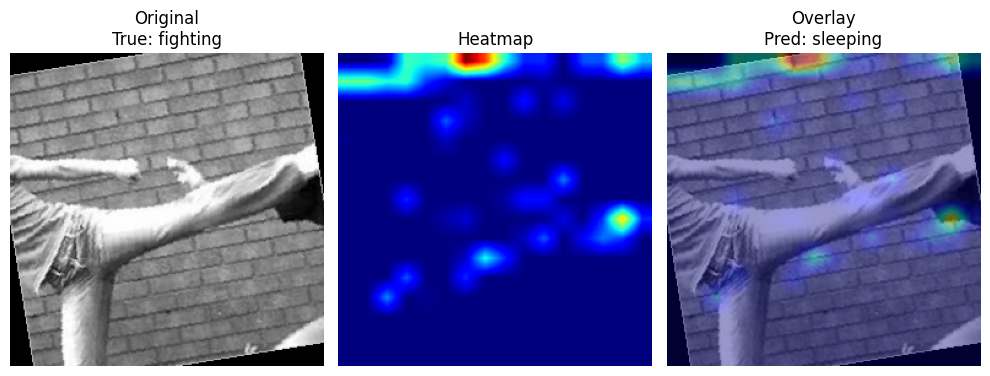

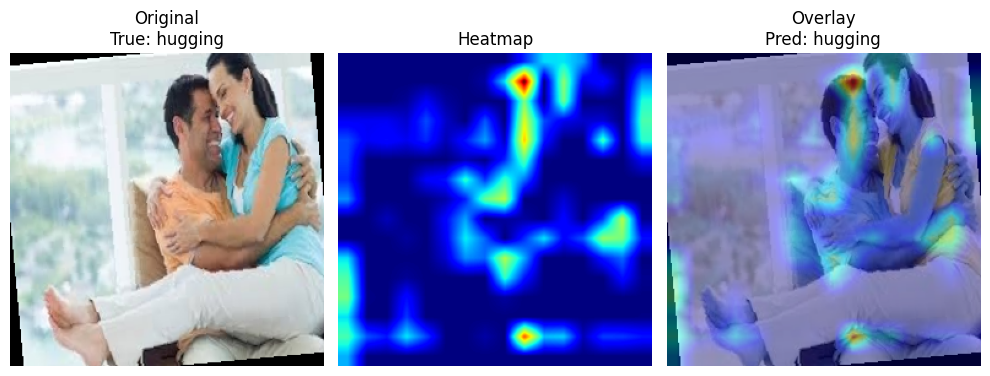

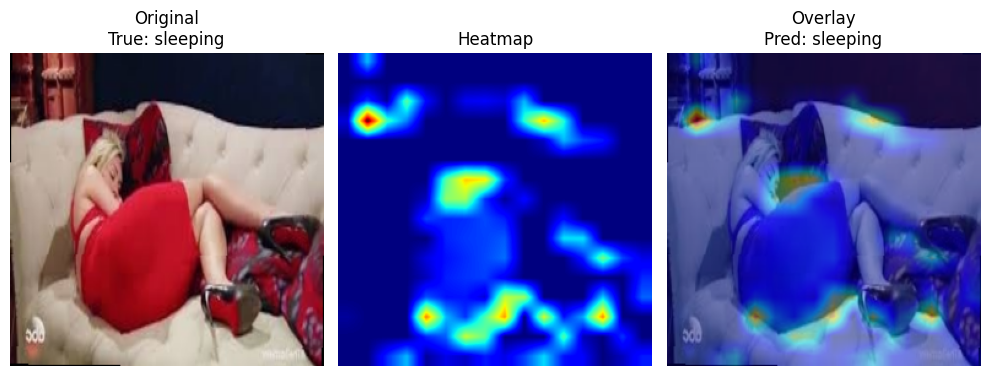

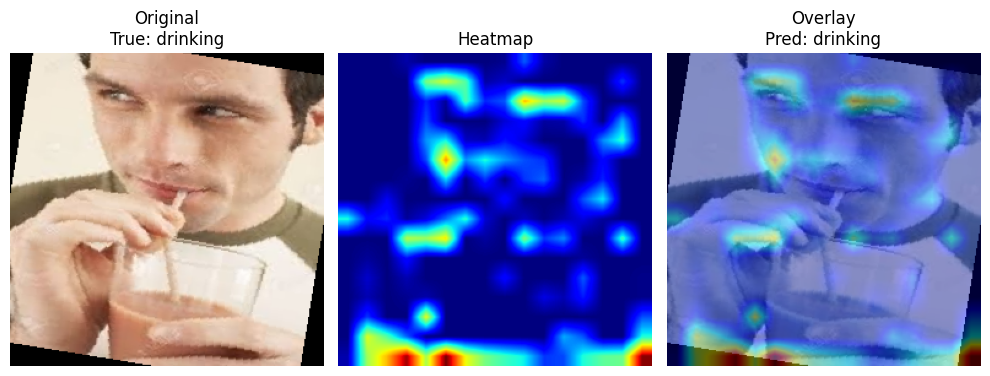

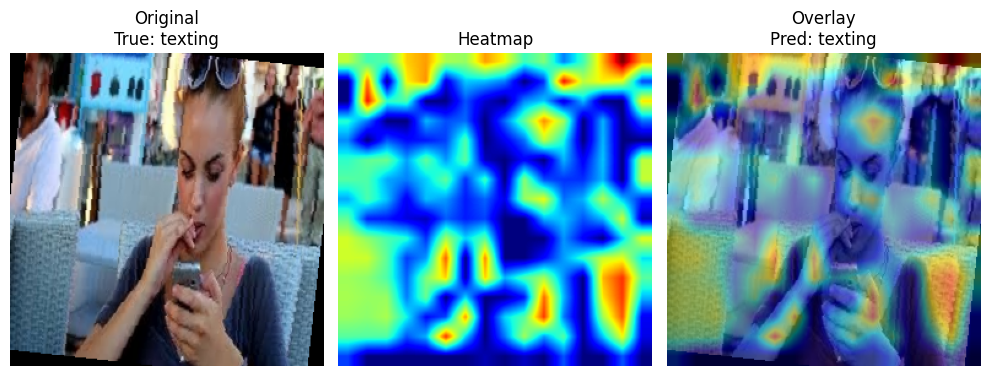

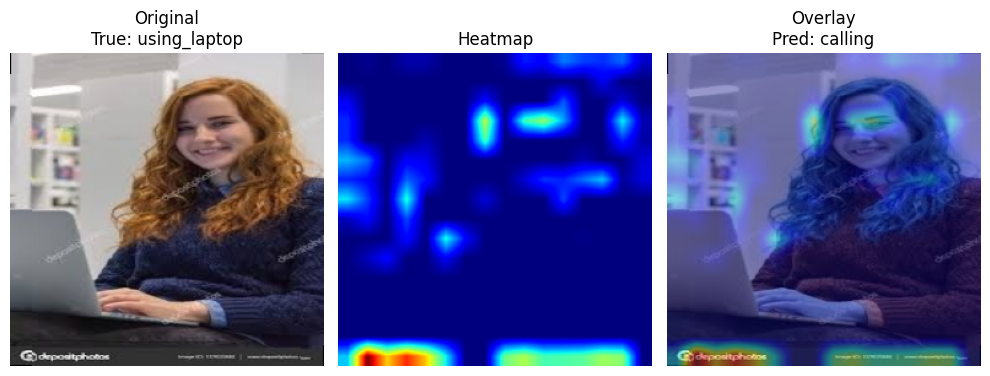

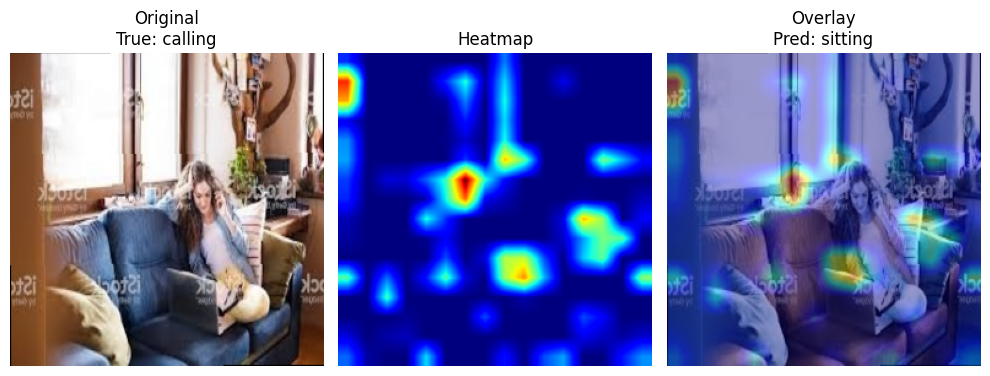

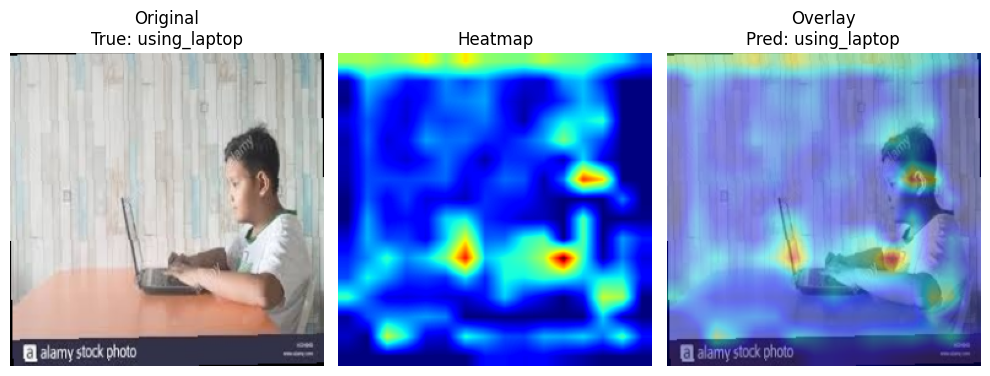

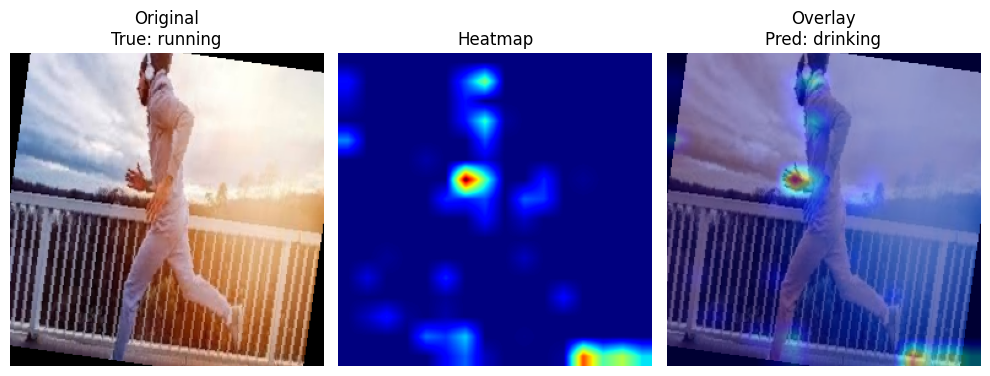

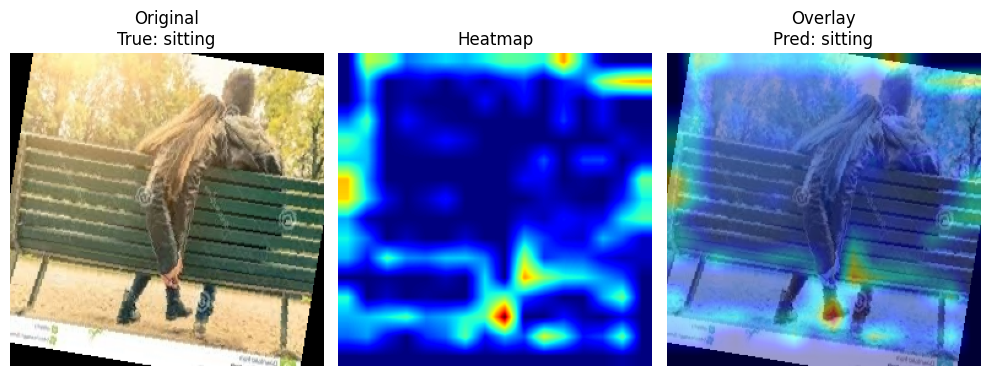

In [ ]:
# **2. 加载最佳模型**
best_model_path_local = "./best_model.pth"
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model.pth"

# **选择合适的模型路径**
model_path = best_model_path_local if os.path.exists(best_model_path_local) else best_model_path_gdrive
print(f"Loading best model from: {model_path}")

# **创建模型并加载权重**
model = CNN(num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
model.eval()  # 设置为评估模式
print(f"Best model loaded successfully!")

# **3. 自动选择 CNN 最后的卷积层**
def find_last_conv_layer(model):
    """自动查找模型中最后一个卷积层"""
    for name, module in reversed(list(model.named_modules())):
        if isinstance(module, nn.Conv2d):
            print(f"Selected target layer: {name}")  # 打印选择的层名
            return module
    raise ValueError("No Conv2d layers found in model")

target_layer = find_last_conv_layer(model)  # 这行替换原来的索引方式
grad_cam = GradCAM(model, target_layer)

from torch.utils.data import SubsetRandomSampler
def create_balanced_test_loader(dataset, num_samples_per_class=3, batch_size=1):
    """ 创建一个新的 DataLoader，确保每个类别有 num_samples_per_class 个样本 """
    class_indices = {i: [] for i in range(len(dataset.classes))}  # 存储类别索引

    # **遍历数据集，收集每个类别的索引**
    for idx, (_, label) in enumerate(dataset.samples):
        if len(class_indices[label]) < num_samples_per_class:
            class_indices[label].append(idx)

    # **Flatten 获取所有索引**
    selected_indices = np.hstack(list(class_indices.values()))

    # **创建新的 DataLoader**
    sampler = SubsetRandomSampler(selected_indices)
    new_loader = DataLoader(dataset, batch_size=batch_size, sampler=sampler)

    return new_loader

# **4. 计算 Grad-CAM 并可视化**
# **创建新的测试集 DataLoader**
test_loader_per_class = create_balanced_test_loader(test_dataset, num_samples_per_class=3, batch_size=1)

# **调用 Grad-CAM 可视化**
apply_grad_cam(test_loader_per_class, model, grad_cam, test_dataset.classes, num_images=10)



In [ ]:
# pip install albumentations opencv-python
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image

# 自定义 transform 类：将 PIL 图像转换为 numpy，再应用 albumentations，然后转回 tensor
class AlbumentationsTransform:
    def __init__(self):
        self.transform = A.Compose([
            A.Resize(256, 256),
            A.HorizontalFlip(p=0.5),
            A.Rotate(limit=5, p=0.7),
            A.Affine(shear=(-4, 4), scale=(0.97, 1.03), translate_percent=(0.02, 0.05), p=0.2),  # 新增仿射变换
            A.Perspective(scale=(0.01, 0.03), keep_size=True, p=0.2), # 新增透视变换
            A.RandomBrightnessContrast(brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), p=0.2),
            A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
            ToTensorV2()
        ])

    def __call__(self, img):
        if isinstance(img, Image.Image):
            img = np.array(img)
        return self.transform(image=img)["image"]

transform = AlbumentationsTransform()

train_dataset = ImageFolder(root=train_dir, transform=transform)
test_dataset = ImageFolder(root=test_dir, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)


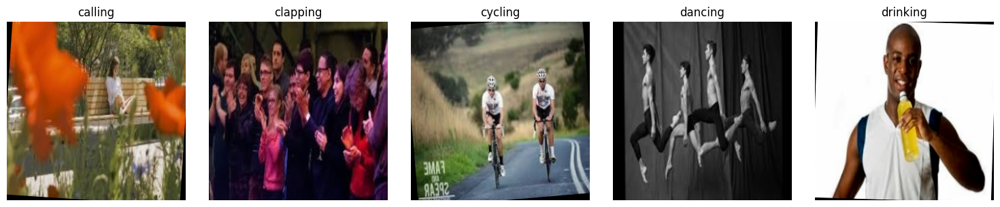

In [ ]:
def show_augmented_images_by_class(dataset, num_classes=5):
    shown_classes = set()
    shown_images = []

    for img, label in dataset:
        class_name = dataset.classes[label]
        if class_name not in shown_classes:
            shown_classes.add(class_name)
            shown_images.append((img, class_name))
        if len(shown_images) >= num_classes:
            break

    plt.figure(figsize=(15, 3))
    for i, (img, class_name) in enumerate(shown_images):
        img_np = img.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np * 0.5 + 0.5).clip(0, 1)

        plt.subplot(1, num_classes, i + 1)
        plt.imshow(img_np)
        plt.title(f"{class_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 展示每个类别 1 张图像（这里最多展示 5 类）
show_augmented_images_by_class(train_dataset, num_classes=5)


In [ ]:
# **8. 创建模型**
num_classes = len(train_dataset.classes)
model = CNN(num_classes).to(device)  # 强制将模型送入 GPU
print(f"模型设备: {next(model.parameters()).device}")  # 确保模型在 GPU

# **9. 损失函数 & 优化器**
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.000001) #默认0.0001

# **10. 训练参数**
num_epochs = 40
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
best_model_path_local = "./best_model_with_ThreeD.pth"  # 先存本地
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model_with_ThreeD.pth"  # 训练结束后再存
best_val_acc = 0.0  # 记录最高验证准确率
best_epoch = 0  # 记录最佳 epoch

模型设备: cuda:0


In [ ]:
batch_size = 64  # 增加 batch_size，提高 GPU 计算效率

In [ ]:
# **11. 训练循环**
if os.path.exists(best_model_path_local):
   model.load_state_dict(torch.load(best_model_path_local))
   print(f" 已加载之前的最优模型：{best_model_path_local}")

for epoch in range(num_epochs):
    start_time = time.time()  # 记录训练时间

    # **训练**
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} (Training)", leave=False)

    for images, labels in train_loader_tqdm:
        images, labels = images.to(device), labels.to(device)  # 确保数据送入 GPU
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # **验证**
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)  # 确保数据送入 GPU
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss = running_loss / len(test_loader)
    val_acc = correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Acc: {train_acc:.4f}, Train Loss: {train_loss:.4f} | Val Acc: {val_acc:.4f}, Val Loss: {val_loss:.4f}")
    print(f" 训练时间: {time.time() - start_time:.2f} 秒")  # 记录训练时间

    # **保存最佳模型**
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_epoch = epoch + 1
        torch.save(model.state_dict(), best_model_path_local)  # 先存本地
        print(f"find better model (Val Acc: {best_val_acc:.4f})，save to `{best_model_path_local}`")

# **12. 训练完成后，拷贝模型到 Google Drive**
import shutil
shutil.copy(best_model_path_local, best_model_path_gdrive)
print(f"best model already copy to Google Drive: {best_model_path_gdrive}")

# **13. 确保模型在 GPU**
print(f"final model at device: {next(model.parameters()).device}")

✅ 已加载之前的最优模型：./best_model_with_ThreeD.pth


Epoch [1/40] - Train Acc: 0.8482, Train Loss: 0.4513 | Val Acc: 0.5884, Val Loss: 1.5114
⏳ 训练时间: 25.60 秒
find better model (Val Acc: 0.5884)，save to `./best_model_with_ThreeD.pth`


Epoch [2/40] - Train Acc: 0.8538, Train Loss: 0.4515 | Val Acc: 0.5820, Val Loss: 1.5124
⏳ 训练时间: 24.88 秒


Epoch [3/40] - Train Acc: 0.8540, Train Loss: 0.4520 | Val Acc: 0.5825, Val Loss: 1.5067
⏳ 训练时间: 24.71 秒


Epoch [4/40] - Train Acc: 0.8546, Train Loss: 0.4460 | Val Acc: 0.5852, Val Loss: 1.5242
⏳ 训练时间: 25.43 秒


Epoch [5/40] - Train Acc: 0.8525, Train Loss: 0.4522 | Val Acc: 0.5873, Val Loss: 1.4980
⏳ 训练时间: 24.89 秒


Epoch [6/40] - Train Acc: 0.8462, Train Loss: 0.4614 | Val Acc: 0.5836, Val Loss: 1.5012
⏳ 训练时间: 24.85 秒


Epoch [7/40] - Train Acc: 0.8506, Train Loss: 0.4557 | Val Acc: 0.5852, Val Loss: 1.5113
⏳ 训练时间: 24.88 秒


Epoch [8/40] - Train Acc: 0.8487, Train Loss: 0.4584 | Val Acc: 0.5868, Val Loss: 1.5067
⏳ 训练时间: 24.69 秒


Epoch [9/40] - Train Acc: 0.8549, Train Loss: 0.4486 | Val Acc: 0.5873, Val Loss: 1.4865
⏳ 训练时间: 26.08 秒


Epoch [10/40] - Train Acc: 0.8491, Train Loss: 0.4618 | Val Acc: 0.5873, Val Loss: 1.5061
⏳ 训练时间: 25.00 秒


Epoch [11/40] - Train Acc: 0.8479, Train Loss: 0.4579 | Val Acc: 0.5873, Val Loss: 1.5029
⏳ 训练时间: 24.83 秒


Epoch [12/40] - Train Acc: 0.8511, Train Loss: 0.4493 | Val Acc: 0.5804, Val Loss: 1.4961
⏳ 训练时间: 24.89 秒


Epoch [13/40] - Train Acc: 0.8544, Train Loss: 0.4472 | Val Acc: 0.5820, Val Loss: 1.5044
⏳ 训练时间: 25.01 秒


Epoch [14/40] - Train Acc: 0.8491, Train Loss: 0.4530 | Val Acc: 0.5836, Val Loss: 1.4991
⏳ 训练时间: 24.86 秒


Epoch [15/40] - Train Acc: 0.8549, Train Loss: 0.4414 | Val Acc: 0.5831, Val Loss: 1.4884
⏳ 训练时间: 24.61 秒


Epoch [16/40] - Train Acc: 0.8491, Train Loss: 0.4551 | Val Acc: 0.5862, Val Loss: 1.5108
⏳ 训练时间: 25.09 秒


Epoch [17/40] - Train Acc: 0.8516, Train Loss: 0.4525 | Val Acc: 0.5889, Val Loss: 1.5140
⏳ 训练时间: 24.95 秒
find better model (Val Acc: 0.5889)，save to `./best_model_with_ThreeD.pth`


Epoch [18/40] - Train Acc: 0.8460, Train Loss: 0.4621 | Val Acc: 0.5889, Val Loss: 1.5030
⏳ 训练时间: 24.85 秒


Epoch [19/40] - Train Acc: 0.8541, Train Loss: 0.4456 | Val Acc: 0.5825, Val Loss: 1.5222
⏳ 训练时间: 25.79 秒


Epoch [20/40] - Train Acc: 0.8493, Train Loss: 0.4587 | Val Acc: 0.5831, Val Loss: 1.5046
⏳ 训练时间: 25.19 秒


Epoch [21/40] - Train Acc: 0.8528, Train Loss: 0.4482 | Val Acc: 0.5841, Val Loss: 1.5111
⏳ 训练时间: 26.87 秒


Epoch [22/40] - Train Acc: 0.8521, Train Loss: 0.4500 | Val Acc: 0.5847, Val Loss: 1.5069
⏳ 训练时间: 25.42 秒


Epoch [23/40] - Train Acc: 0.8502, Train Loss: 0.4608 | Val Acc: 0.5889, Val Loss: 1.5206
⏳ 训练时间: 25.20 秒


Epoch [24/40] - Train Acc: 0.8500, Train Loss: 0.4635 | Val Acc: 0.5852, Val Loss: 1.5020
⏳ 训练时间: 24.80 秒


Epoch [25/40] - Train Acc: 0.8561, Train Loss: 0.4500 | Val Acc: 0.5852, Val Loss: 1.5077
⏳ 训练时间: 24.80 秒


Epoch [26/40] - Train Acc: 0.8504, Train Loss: 0.4611 | Val Acc: 0.5762, Val Loss: 1.5136
⏳ 训练时间: 25.00 秒


Epoch [27/40] - Train Acc: 0.8528, Train Loss: 0.4588 | Val Acc: 0.5852, Val Loss: 1.5056
⏳ 训练时间: 24.75 秒


Epoch [28/40] - Train Acc: 0.8522, Train Loss: 0.4492 | Val Acc: 0.5799, Val Loss: 1.5143
⏳ 训练时间: 25.19 秒


Epoch [29/40] - Train Acc: 0.8534, Train Loss: 0.4557 | Val Acc: 0.5810, Val Loss: 1.5183
⏳ 训练时间: 25.15 秒


Epoch [30/40] - Train Acc: 0.8525, Train Loss: 0.4579 | Val Acc: 0.5899, Val Loss: 1.4996
⏳ 训练时间: 24.98 秒
find better model (Val Acc: 0.5899)，save to `./best_model_with_ThreeD.pth`


Epoch [31/40] - Train Acc: 0.8553, Train Loss: 0.4461 | Val Acc: 0.5804, Val Loss: 1.4921
⏳ 训练时间: 24.83 秒


Epoch [32/40] - Train Acc: 0.8482, Train Loss: 0.4580 | Val Acc: 0.5836, Val Loss: 1.5046
⏳ 训练时间: 24.70 秒


Epoch [33/40] - Train Acc: 0.8552, Train Loss: 0.4481 | Val Acc: 0.5852, Val Loss: 1.5144
⏳ 训练时间: 25.01 秒


Epoch [34/40] - Train Acc: 0.8498, Train Loss: 0.4557 | Val Acc: 0.5862, Val Loss: 1.5178
⏳ 训练时间: 24.95 秒


Epoch [35/40] - Train Acc: 0.8550, Train Loss: 0.4476 | Val Acc: 0.5820, Val Loss: 1.5035
⏳ 训练时间: 24.87 秒


Epoch [36/40] - Train Acc: 0.8519, Train Loss: 0.4517 | Val Acc: 0.5825, Val Loss: 1.5055
⏳ 训练时间: 24.95 秒


Epoch [37/40] - Train Acc: 0.8526, Train Loss: 0.4452 | Val Acc: 0.5836, Val Loss: 1.5172
⏳ 训练时间: 24.90 秒


Epoch [38/40] - Train Acc: 0.8498, Train Loss: 0.4558 | Val Acc: 0.5847, Val Loss: 1.5107
⏳ 训练时间: 24.85 秒


Epoch [39/40] - Train Acc: 0.8528, Train Loss: 0.4477 | Val Acc: 0.5852, Val Loss: 1.5126
⏳ 训练时间: 24.67 秒


Epoch [40/40] - Train Acc: 0.8500, Train Loss: 0.4531 | Val Acc: 0.5794, Val Loss: 1.5084
⏳ 训练时间: 24.68 秒
best model already copy to Google Drive: /content/drive/MyDrive/project_2025/best_model_with_ThreeD.pth
final model at device: cuda:0


Loading best model from: ./best_model_with_ThreeD.pth
Best model loaded successfully!

Final test accuracy: 0.5889

Classification Metrics:
Accuracy : 0.5889
Precision: 0.5885
Recall   : 0.5889
F1 Score : 0.5880

Per-class Report:
                    precision    recall  f1-score   support

           calling       0.47      0.44      0.46       126
          clapping       0.61      0.52      0.56       126
           cycling       0.88      0.89      0.89       126
           dancing       0.63      0.67      0.65       126
          drinking       0.47      0.45      0.46       126
            eating       0.75      0.83      0.79       126
          fighting       0.68      0.70      0.69       126
           hugging       0.55      0.52      0.53       126
          laughing       0.63      0.63      0.63       126
listening_to_music       0.46      0.48      0.47       126
           running       0.74      0.71      0.73       126
           sitting       0.42      0.41      0.4

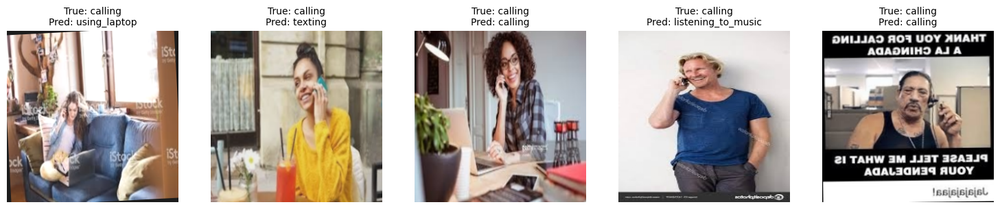

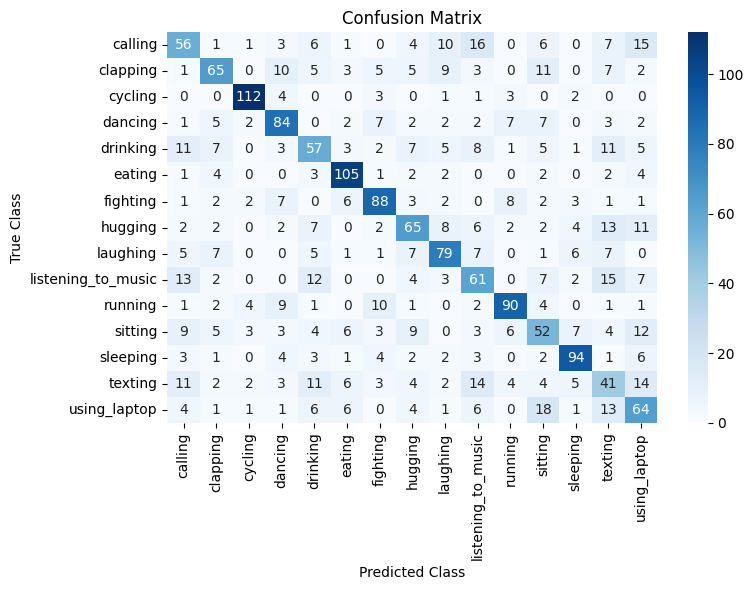

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from torchvision import transforms

# === 加载模型 ===
best_model_path_local = "./best_model_with_ThreeD.pth"
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model_with_ThreeD.pth"

model_path = best_model_path_local if os.path.exists(best_model_path_local) else best_model_path_gdrive
print(f"Loading best model from: {model_path}")

model = CNN(num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
model.eval()
print("Best model loaded successfully!")

# === 计算预测 ===
correct, total = 0, 0
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

final_test_acc = correct / total
print(f"\nFinal test accuracy: {final_test_acc:.4f}")

# === 计算并打印分类指标 ===
acc = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')
recall = recall_score(all_labels, all_preds, average='macro')
f1 = f1_score(all_labels, all_preds, average='macro')

print("\nClassification Metrics:")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

# === 每类指标报告 ===
print("\nPer-class Report:")
print(classification_report(all_labels, all_preds, target_names=test_dataset.classes))

# === 可视化部分预测结果 ===
def show_predictions(test_loader, model, class_names, num_images=5):
    model.eval()
    images_shown = 0
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 3, 3))

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            for i in range(images.size(0)):
                if images_shown >= num_images:
                    break

                img = images[i].cpu().permute(1, 2, 0).numpy()
                img = img * 0.5 + 0.5  # 反归一化

                true_label = class_names[labels[i].item()]
                pred_label = class_names[predicted[i].item()]

                ax = axes[images_shown]
                ax.imshow(img)
                ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=10)
                ax.axis("off")

                images_shown += 1

            if images_shown >= num_images:
                break

    plt.tight_layout()
    plt.show()

# === 混淆矩阵绘制函数 ===
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

# === 可视化预测样本 + 混淆矩阵 ===
show_predictions(test_loader, model, test_dataset.classes, num_images=5)
plot_confusion_matrix(all_labels, all_preds, test_dataset.classes)


Loading best model from: ./best_model_with_ThreeD.pth
Best model loaded successfully!
Selected target layer: features.16


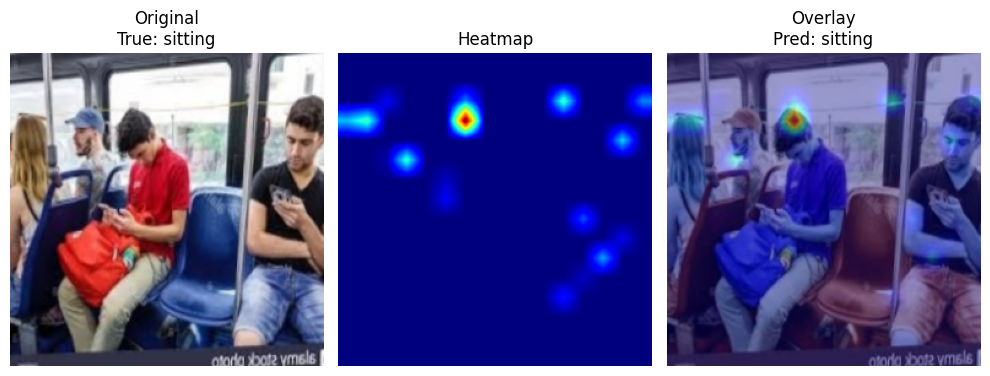

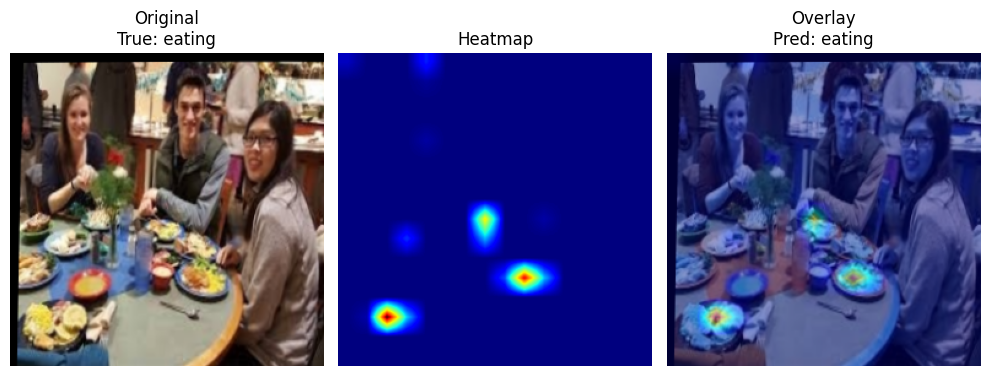

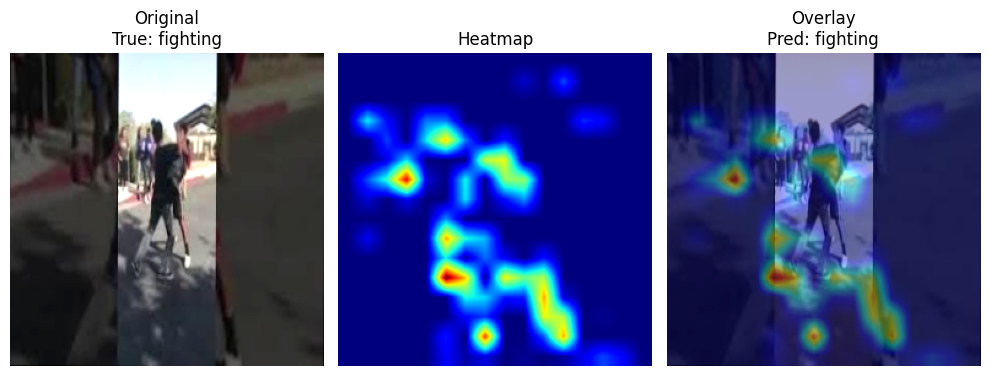

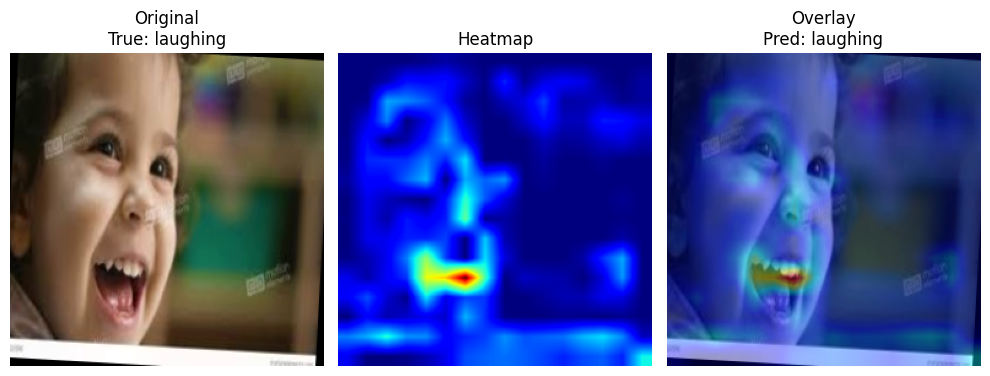

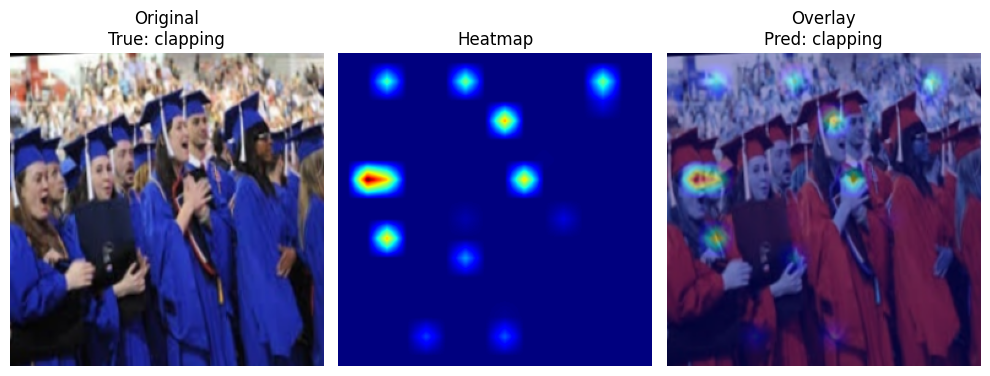

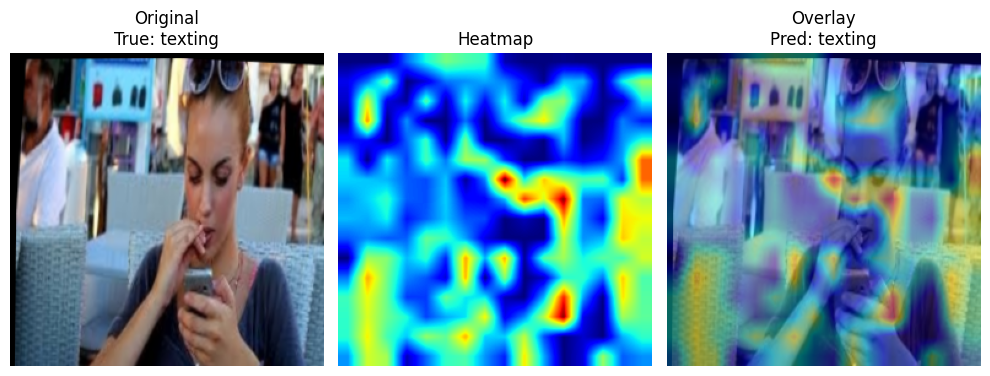

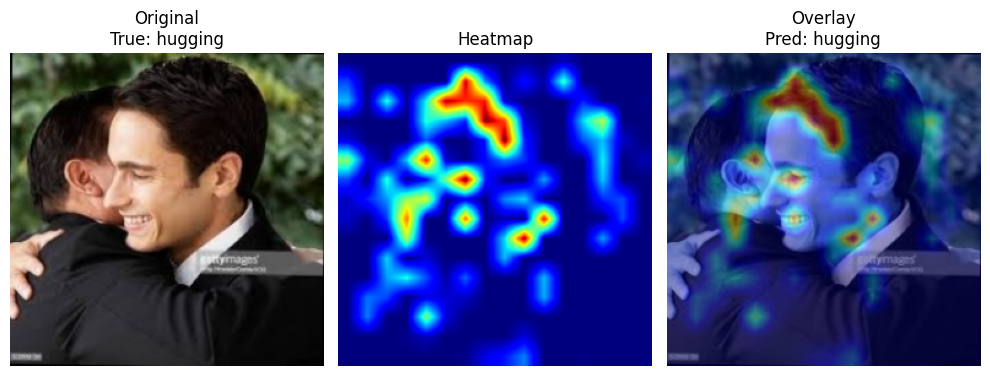

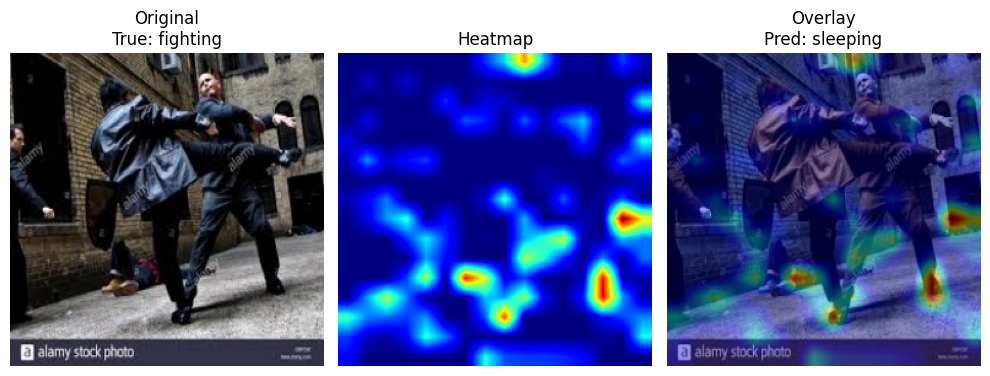

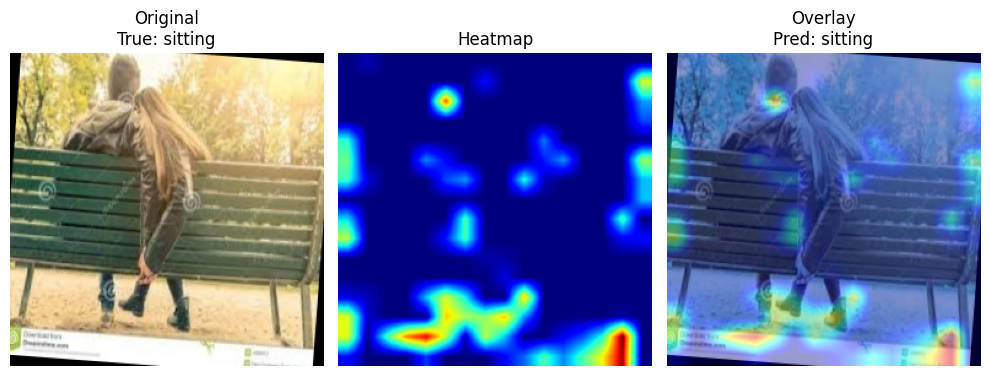

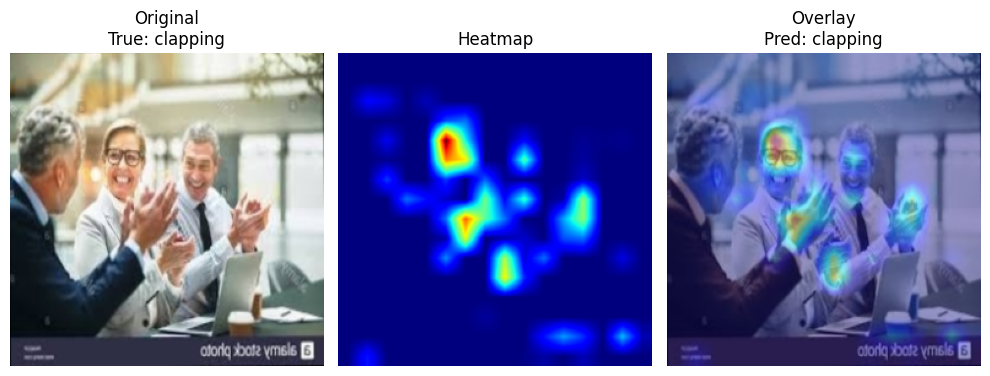

In [ ]:
# **2. 加载最佳模型**
best_model_path_local = "./best_model_with_ThreeD.pth"
best_model_path_gdrive = "/content/drive/MyDrive/project_2025/best_model_with_ThreeD.pth"

# **选择合适的模型路径**
model_path = best_model_path_local if os.path.exists(best_model_path_local) else best_model_path_gdrive
print(f"Loading best model from: {model_path}")

# **创建模型并加载权重**
model = CNN(num_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
model.eval()  # 设置为评估模式
print(f"Best model loaded successfully!")

# **3. 自动选择 CNN 最后的卷积层**
def find_last_conv_layer(model):
    """自动查找模型中最后一个卷积层"""
    for name, module in reversed(list(model.named_modules())):
        if isinstance(module, nn.Conv2d):
            print(f"Selected target layer: {name}")  # 打印选择的层名
            return module
    raise ValueError("No Conv2d layers found in model")

target_layer = find_last_conv_layer(model)
grad_cam = GradCAM(model, target_layer)

from torch.utils.data import SubsetRandomSampler
def create_balanced_test_loader(dataset, num_samples_per_class=3, batch_size=1):
    """ 创建一个新的 DataLoader，确保每个类别有 num_samples_per_class 个样本 """
    class_indices = {i: [] for i in range(len(dataset.classes))}  # 存储类别索引

    # **遍历数据集，收集每个类别的索引**
    for idx, (_, label) in enumerate(dataset.samples):
        if len(class_indices[label]) < num_samples_per_class:
            class_indices[label].append(idx)

    # **Flatten 获取所有索引**
    selected_indices = np.hstack(list(class_indices.values()))

    # **创建新的 DataLoader**
    sampler = SubsetRandomSampler(selected_indices)
    new_loader = DataLoader(dataset, batch_size=batch_size, sampler=sampler)

    return new_loader

# **4. 计算 Grad-CAM 并可视化**
# **创建新的测试集 DataLoader**
test_loader_per_class = create_balanced_test_loader(test_dataset, num_samples_per_class=3, batch_size=1)

# **调用 Grad-CAM 可视化**
apply_grad_cam(test_loader_per_class, model, grad_cam, test_dataset.classes, num_images=10)


In [ ]:
# === 安装或确认依赖（如在 Colab 可取消注释）===
# !pip install -U albumentations

import torch
import numpy as np
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
import torch.nn as nn

# === 设置设备 ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# === 定义包含污损的验证增强 transform ===
class CorruptedValTransform:
    def __init__(self):
        self.transform = A.Compose([
            A.Resize(256, 256),

            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),

            A.OneOf([
                A.MotionBlur(blur_limit=5),
                A.GaussianBlur(blur_limit=(3, 5)),
                A.MedianBlur(blur_limit=3)
            ], p=0.3),

            A.OneOf([
                A.GaussNoise(p=0.3),
                A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.1, 0.5), p=1.0)
            ], p=0.3),

            A.ImageCompression(quality_lower=30, quality_upper=70, p=0.3),

            A.CoarseDropout(p=0.2),

            A.RandomGamma(gamma_limit=(80, 120), p=0.3),

            A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
            ToTensorV2()
        ])

    def __call__(self, img):
        if isinstance(img, Image.Image):
            img = np.array(img)
        return self.transform(image=img)["image"]

# === 加载增强验证集 ===
test_dir = "/content/drive/MyDrive/project_2025/archive/Structured/test"
val_dataset = ImageFolder(root=test_dir, transform=CorruptedValTransform())

batch_size = 64
num_workers = 2
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)

# === 定义模型评估函数（输出所有分类指标） ===
def evaluate_model(model_path, model_class, num_classes, description):
    print(f"\n 加载模型: {description}")
    model = model_class(num_classes=num_classes).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    criterion = nn.CrossEntropyLoss()
    total, correct = 0, 0
    running_loss = 0.0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Evaluating: {description}"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='macro')
    recall = recall_score(all_labels, all_preds, average='macro')
    f1 = f1_score(all_labels, all_preds, average='macro')
    avg_loss = running_loss / len(val_loader)

    print(f"\n {description} 评估完毕：")
    print(f"Val Accuracy : {acc:.4f}")
    print(f"Val Loss     : {avg_loss:.4f}")
    print(f"Precision    : {precision:.4f}")
    print(f"Recall       : {recall:.4f}")
    print(f"F1 Score     : {f1:.4f}")

    print("\n 每类指标（classification_report）:")
    print(classification_report(all_labels, all_preds, target_names=val_dataset.classes))

# === 替换为你的 CNN 类（确保已定义）===
# from your_model_file import CNN
# 假设已在环境中定义 class CNN(nn.Module):

# === 对两个模型进行评估 ===
evaluate_model(
    model_path="/content/drive/MyDrive/project_2025/best_model.pth",
    model_class=CNN,
    num_classes=len(val_dataset.classes),
    description="原始模型（无3D增强）"
)

evaluate_model(
    model_path="/content/drive/MyDrive/project_2025/best_model_with_ThreeD.pth",
    model_class=CNN,
    num_classes=len(val_dataset.classes),
    description="3D增强模型"
)


<ipython-input-28-1dc6ba426426>:37: UserWarning: Argument(s) 'quality_lower, quality_upper' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=30, quality_upper=70, p=0.3),



📦 加载模型: 原始模型（无3D增强）


Evaluating: 原始模型（无3D增强）: 100%|██████████| 30/30 [00:06<00:00,  4.39it/s]



✅ 原始模型（无3D增强） 评估完毕：
Val Accuracy : 0.4646
Val Loss     : 2.7065
Precision    : 0.4922
Recall       : 0.4646
F1 Score     : 0.4694

📄 每类指标（classification_report）:
                    precision    recall  f1-score   support

           calling       0.20      0.38      0.26       126
          clapping       0.53      0.31      0.39       126
           cycling       0.80      0.71      0.75       126
           dancing       0.45      0.60      0.51       126
          drinking       0.40      0.36      0.38       126
            eating       0.79      0.62      0.69       126
          fighting       0.41      0.54      0.47       126
           hugging       0.52      0.32      0.39       126
          laughing       0.50      0.57      0.53       126
listening_to_music       0.50      0.41      0.45       126
           running       0.56      0.56      0.56       126
           sitting       0.32      0.38      0.35       126
          sleeping       0.57      0.58      0.58       

Evaluating: 3D增强模型: 100%|██████████| 30/30 [00:06<00:00,  4.63it/s]


✅ 3D增强模型 评估完毕：
Val Accuracy : 0.4884
Val Loss     : 2.3419
Precision    : 0.5027
Recall       : 0.4884
F1 Score     : 0.4896

📄 每类指标（classification_report）:
                    precision    recall  f1-score   support

           calling       0.34      0.30      0.32       126
          clapping       0.56      0.32      0.40       126
           cycling       0.83      0.73      0.78       126
           dancing       0.52      0.60      0.56       126
          drinking       0.38      0.44      0.41       126
            eating       0.75      0.71      0.73       126
          fighting       0.38      0.60      0.46       126
           hugging       0.49      0.42      0.45       126
          laughing       0.56      0.54      0.55       126
listening_to_music       0.44      0.39      0.41       126
           running       0.53      0.61      0.57       126
           sitting       0.34      0.40      0.37       126
          sleeping       0.71      0.54      0.61       126
 